In [1]:
import obspy
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import welch
from datetime import datetime, timedelta
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec


In [8]:
path = "../SL/DATA_20Hz/"
stnm = '004'
# Collect SAC files
sac_files = sorted(glob.glob(f"{path}/*/{stnm}*.SAC"))




In [3]:
seis_sta=pd.read_csv('redbutte_sta.csv')
seis_sta['stnm']=seis_sta['stnm'].astype(int).apply(lambda i: f"{i:03}")
seis_sta=seis_sta[:-1] 
print(seis_sta)

# Mapping dictionary
rename_map = {
    "002": "N051",
    "001": "N037",
    "003": "N018",
    "004": "S009",
    "005": "S024",
    "006": "S043"
}

# Example: renaming a list of station codes
stations = ["002", "001", "003", "004", "005", "006"]

renamed_stations = [rename_map[st] for st in stations]
print(renamed_stations)
# Output: ['N037', 'N051', 'N018', 'S009', 'S024', 'S043']
seis_sta['stnm_renamed']=renamed_stations
print(seis_sta)


  stnm        lat         lon    elev
0  002  40.794796 -111.779490  1868.0
1  001  40.794836 -111.779309  1868.0
2  003  40.794740 -111.779110  1847.0
3  004  40.794670 -111.778810  1847.0
4  005  40.794660 -111.778630  1847.0
5  006  40.794660 -111.778400  1847.0
['N051', 'N037', 'N018', 'S009', 'S024', 'S043']
  stnm        lat         lon    elev stnm_renamed
0  002  40.794796 -111.779490  1868.0         N051
1  001  40.794836 -111.779309  1868.0         N037
2  003  40.794740 -111.779110  1847.0         N018
3  004  40.794670 -111.778810  1847.0         S009
4  005  40.794660 -111.778630  1847.0         S024
5  006  40.794660 -111.778400  1847.0         S043


In [4]:
def PSD_analysis(sac_files):
    results = []
    fs = None
    for f in sac_files:
        tr = obspy.read(f)[0]
        if fs is None:
            fs = tr.stats.sampling_rate
        
        # Welch PSD
        fvals, Pxx = welch(tr.data, fs=fs, nperseg=int(fs*60))
        
        # Band-averaged power
        band1 = np.mean(Pxx[(fvals >= 2) & (fvals < 4)])
        band2 = np.mean(Pxx[(fvals >= 4) & (fvals < 8)])
        
        results.append({
            "date": tr.stats.starttime.date,
            "component": tr.stats.channel,   # e.g., BHZ, BHN, BHE
            "PSD_2_4Hz": band1,
            "PSD_4_8Hz": band2
        })
    return pd.DataFrame(results)

In [9]:
### checking on PSD

# import matplotlib.pyplot as plt
# from obspy import read
# from scipy.signal import welch

# # Read one file for now
# f = sac_files[:1][0]   # <-- get the actual filename
# tr = read(f)[0]

# fs = tr.stats.sampling_rate

# # Welch PSD
# fvals, Pxx = welch(tr.data, fs=fs, nperseg=int(fs*60))
# # Plot
# plt.figure(figsize=(8,5))
# plt.semilogy(fvals, Pxx, label="Welch PSD")
# plt.xlabel("Frequency [Hz]")
# plt.ylabel("PSD [V²/Hz]")
# plt.xscale('log')
# plt.yscale("log")
# plt.xlim(1, fs/2)
# plt.title(f"Power Spectral Density - {tr.stats.station}")
# plt.grid(True, which="both", ls="--", alpha=0.6)
# plt.legend()
# plt.show()

# import matplotlib.pyplot as plt
# from obspy import read
# from obspy.signal.util import _npts2nfft
# from scipy.signal import welch

# f = sac_files[:1][0]
# tr = read(f)[0]

# fs = tr.stats.sampling_rate
# nfft = _npts2nfft(len(tr.data))

# # Welch PSD
# fvals, Pxx = welch(tr.data, fs=fs, nperseg=int(fs*60))

# plt.figure(figsize=(8,5))
# plt.semilogy(fvals, Pxx)
# plt.xlabel("Frequency [Hz]")
# plt.ylabel("PSD [counts²/Hz]")
# plt.title(f"PSD - {tr.stats.station}")
# plt.grid(True, which="both", ls="--", alpha=0.6)
# plt.show()



In [5]:
def PSD_plot(df, stnm, full_index, swap_file="swap.redb"):

    # --- Read swap dates ---
    swap_dates = []
    with open(swap_file, 'r') as f:
        for line in f:
            parts = line.split()
            for p in parts:
                # Convert YYMMDD → YYYY-MM-DD
                yyyy = int(p[:2])
                yyyy += 2000  # assume 20xx
                mm = int(p[2:4])
                dd = int(p[4:6])
                swap_dates.append(pd.to_datetime(f"{yyyy}-{mm:02d}-{dd:02d}"))

    # Make plots
    fig, axes = plt.subplots(2, 1, figsize=(8,6), sharex=True)

    # --- Subplot 1: 2–4 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df[df["component"] == comp].reindex(full_index)
        axes[1].plot(dsub.index, 10*np.log10(dsub["PSD_2_4Hz"]), "-o", ms=2, label=comp, alpha=0.5)
    axes[1].set_title(f"{stnm} at 2–4 Hz")

    # --- Subplot 2: 4–8 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df[df["component"] == comp].reindex(full_index)
        axes[0].plot(dsub.index, 10*np.log10(dsub["PSD_4_8Hz"]), "-o", ms=2, label=comp, alpha=0.5)
    axes[0].set_title(f"{stnm} at 4–8 Hz")

    # --- Format axes, grid, legend, x-axis ---
    for ax in axes:
        ax.label_outer()
        ax.legend()
        ax.set_xlim(pd.to_datetime("2023-06-01"), pd.to_datetime("2023-11-20"))
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        ax.grid(True, which='major', linestyle='--', alpha=0.5)
        ax.set_xlabel("Date")
        ax.set_ylabel("Power (dB)")

        # --- Add vertical lines for swapping dates ---
        for d in swap_dates:
            ax.axvline(d, color='blue', linestyle='--', alpha=0.5)

    # Rotate x-axis labels
    plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=90)
    plt.tight_layout()
    plt.savefig(f"PSD_{stnm}.png", dpi=500)


In [6]:
def PSD_demean_plot(df, stnm, full_index, swap_file="swap.redb"):

    # --- Read swap dates ---
    swap_dates = []
    with open(swap_file, 'r') as f:
        for line in f:
            parts = line.split()
            for p in parts:
                # Convert YYMMDD → YYYY-MM-DD
                yyyy = int(p[:2])
                yyyy += 2000  # assume 20xx
                mm = int(p[2:4])
                dd = int(p[4:6])
                swap_dates.append(pd.to_datetime(f"{yyyy}-{mm:02d}-{dd:02d}"))

    # Make plots
    fig, axes = plt.subplots(2, 2, figsize=(16,6), sharex=True)
 
    # --- Format axes, grid, legend, x-axis ---
    for ax in axes.flatten():
        ax.set_xlim(pd.to_datetime("2023-06-01"), pd.to_datetime("2023-11-20"))
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        ax.grid(True, which='major', linestyle='--', alpha=0.5)
        ax.set_xlabel("Date")
        ax.set_ylabel("Power (dB)")

        # --- Add vertical lines for swapping dates ---
        for d in swap_dates:
            ax.axvline(d, color='blue', linestyle='--', linewidth=1, alpha=0.5)

    # --- Subplot 1: 2–4 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df[df["component"] == comp].reindex(full_index)
        # Convert to dB
        psd_db = 10 * np.log10(dsub["PSD_2_4Hz"])

        axes[1, 0].plot(dsub.index, psd_db, "-o", ms=2, label=comp, alpha=0.5)
        axes[1, 1].plot(dsub.index, (psd_db - psd_db.mean()).abs(), "s", ms=2.5, label=comp, alpha=0.6)

    axes[1,0].set_title(f"{stnm} at 2–4 Hz")
    axes[1,1].set_title(f"|demeaned PSD| at {stnm} at 2–4 Hz")

    # --- Subplot 2: 4–8 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df[df["component"] == comp].reindex(full_index)
        psd_db = 10 * np.log10(dsub["PSD_4_8Hz"])
        
        axes[0, 0].plot(dsub.index, psd_db, "-o", ms=2, label=comp, alpha=0.5)
        axes[0, 1].plot(dsub.index, (psd_db - psd_db.mean()).abs(), "s", ms=2.5, label=comp, alpha=0.6)
    axes[0,0].set_title(f"{stnm} at 4–8 Hz")
    axes[0,1].set_title(f"|demeaned PSD| at {stnm} at 4–8 Hz ")

    for ax in axes.flatten():
        # ax.label_outer()
        ax.legend()

    # Rotate x-axis labels
    plt.setp(axes[1,0].xaxis.get_majorticklabels(), rotation=90)
    plt.setp(axes[1,1].xaxis.get_majorticklabels(), rotation=90)
    plt.tight_layout()
    # plt.show()
    plt.savefig(f"PSD_{stnm}.png", dpi=500)


In [47]:

def three_PSD_demean_plot(df, stnm, full_index, swap_file="swap.redb"):

    # --- Read swap dates ---
    swap_dates = []
    with open(swap_file, 'r') as f:
        for line in f:
            parts = line.split()
            for p in parts:
                # Convert YYMMDD → YYYY-MM-DD
                yyyy = int(p[:2])
                yyyy += 2000  # assume 20xx
                mm = int(p[2:4])
                dd = int(p[4:6])
                swap_dates.append(pd.to_datetime(f"{yyyy}-{mm:02d}-{dd:02d}"))

    # Make plots
    fig, axes = plt.subplots(3, 4, figsize=(16,16), sharey=True)
    
    # --- Format axes, grid, legend, x-axis ---
    for ax in axes.flatten():
        ax.set_ylim(pd.to_datetime("2023-11-20"),pd.to_datetime("2023-06-01"))
        ax.yaxis.set_major_locator(mdates.DayLocator(interval=6))
        ax.yaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        ax.grid(True, which='major', linestyle='--', alpha=0.5)

        # --- Add vertical lines for swapping dates ---
        for d in swap_dates:
            ax.axhline(d, color='k', linestyle='--', linewidth=1, alpha=0.5)

    # --- Subplot 1: 2–4 Hz ---
    for nk, (ch1, ch2) in enumerate([["DPN", "DPE"], ["DPZ", "DPE"], ["DPZ", "DPN"]]):
        for mk, comp in enumerate([ch1, ch2]):
            dsub = df[df["component"] == comp].reindex(full_index)
            psd_db = 10 * np.log10(dsub["PSD_2_4Hz"])
            axes[nk, 0].plot( psd_db, dsub.index, "-s",lw=1, ms=2.5, label=comp, alpha=0.7 )
            # axes[nk, 0].plot( psd_db-psd_db.mean() , dsub.index, "-s",lw=1, ms=2.5, label=comp, alpha=0.7 )
            axes[nk, 0].set_title(f"{stnm} PSD at 2–4 Hz", fontsize=16)
            axes[nk, 0].set_xlabel(" Power (dB)", fontsize=14)
            axes[nk, 0].legend(loc='upper right', fontsize=12)
            if mk ==0:
                tmppsd=psd_db
            if mk ==1:
                axes[nk, 1].set_xlabel("Ratio", fontsize=14)
                axes[nk, 1].set_xlim(0,2)
                axes[nk, 1].set_title(f"{ch1}/{ch2} PSD ratio", fontsize=16)
                axes[nk, 1].plot( tmppsd/psd_db , dsub.index, "-s",lw=1, ms=2.2, color='green',
                                 label=f'{ch1}/{ch2}', alpha=0.7 )
                axes[nk, 1].legend(loc='upper left', fontsize=12)
            

    # --- Subplot 2: 4–8 Hz ---
    for nk, (ch1, ch2) in enumerate([["DPN", "DPE"], ["DPZ", "DPE"], ["DPZ", "DPN"]]):
        for mk, comp in enumerate([ch1, ch2]):
            dsub = df[df["component"] == comp].reindex(full_index)
            psd_db = 10 * np.log10(dsub["PSD_4_8Hz"])
            # axes[nk, 2].plot( psd_db-psd_db.mean(),dsub.index, "-s",lw=1, ms=2.5, label=comp, alpha=0.7 )
            axes[nk, 2].plot( psd_db,dsub.index, "-s",lw=1, ms=2.5, label=comp, alpha=0.7 )
            axes[nk, 2].set_title(f"{stnm} PSD at 4-8 Hz", fontsize=16)
            axes[nk, 2].set_xlabel(" Power (dB)", fontsize=14)
            axes[nk, 2].legend(loc='upper right', fontsize=12)
            if mk ==0:
                tmppsd=psd_db
            if mk ==1:
                axes[nk, 3].set_xlabel("Ratio", fontsize=14)
                axes[nk, 3].set_xlim(0,2)
                axes[nk, 3].set_title(f"{ch1}/{ch2} PSD ratio", fontsize=16)
                axes[nk, 3].plot( tmppsd/psd_db , dsub.index, "-s",lw=1, ms=2.2, color='green',
                                 label=f'{ch1}/{ch2}', alpha=0.7 )
                axes[nk, 3].legend(loc='upper left', fontsize=12)
                
    for ax in axes.flatten():
        # ax.label_outer()
        ax.invert_yaxis()
        ax.yaxis.get_majorticklabels()
        

    plt.tight_layout()
    plt.savefig(f"PSDraw_ratio_{stnm}.png", dpi=200)
    plt.show()

In [8]:
# Put into DataFrame
df = PSD_analysis(sac_files)
df["date"] = pd.to_datetime(df["date"])
df.set_index("date", inplace=True)

# Reindex to full daily range
full_index = pd.date_range(df.index.min(), df.index.max(), freq="D")


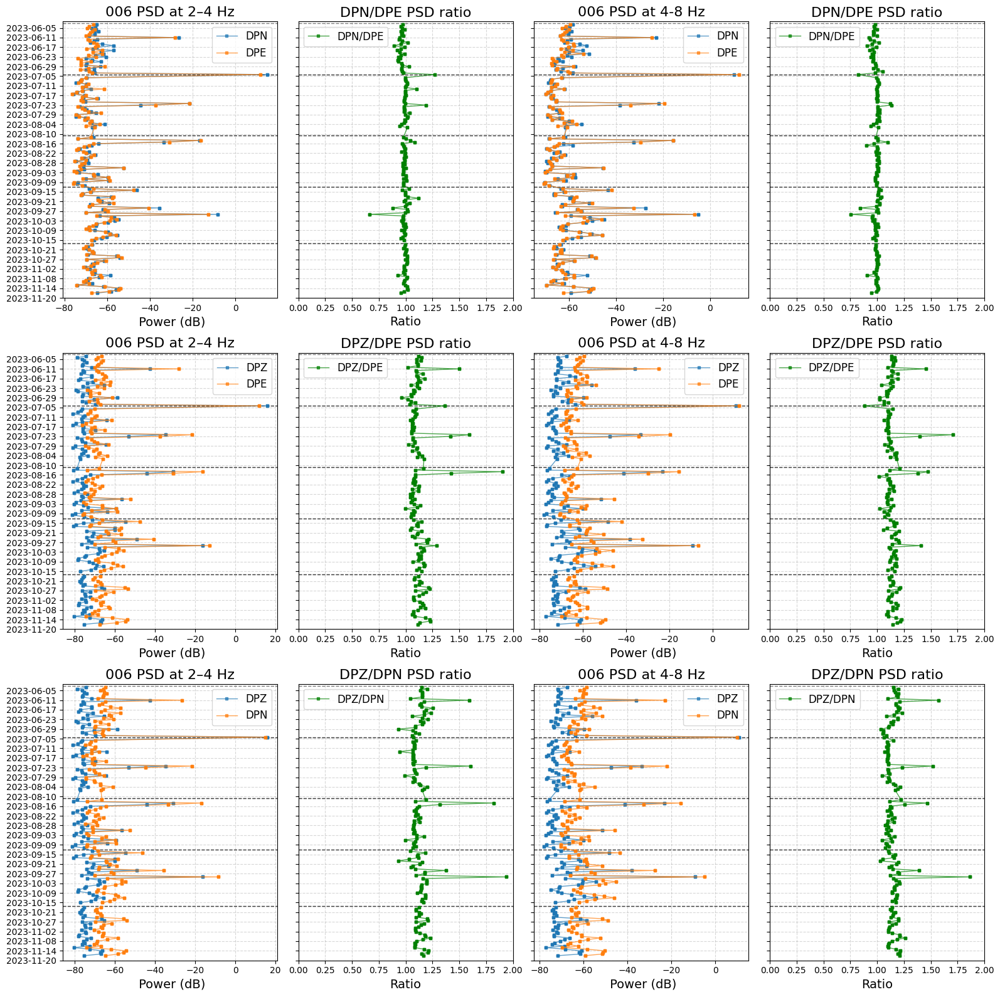

In [48]:
# PSD_plot(df, stnm, full_index)
# PSD_demean_plot(df, stnm, full_index)
three_PSD_demean_plot(df, stnm, full_index)

0 002 N051


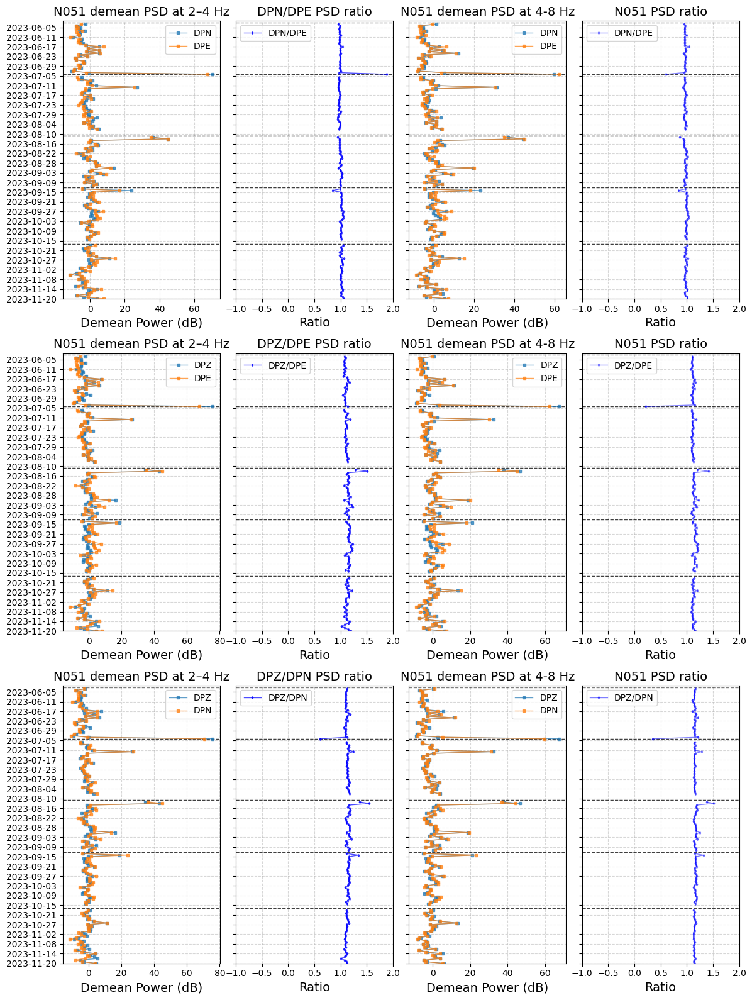

1 001 N037


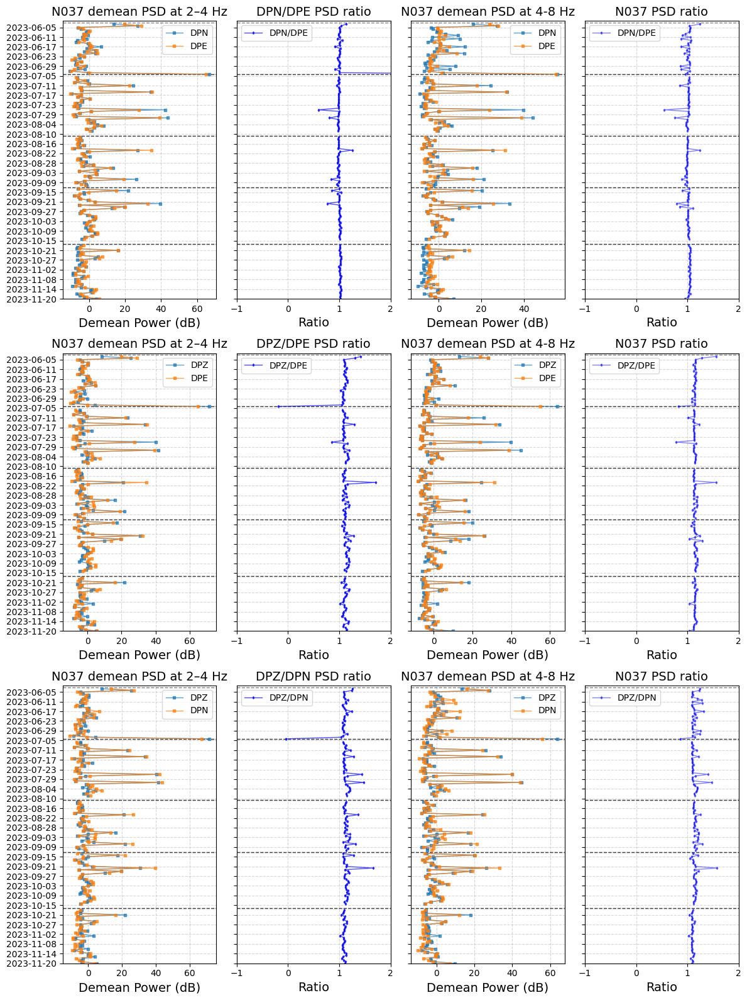

2 003 N018


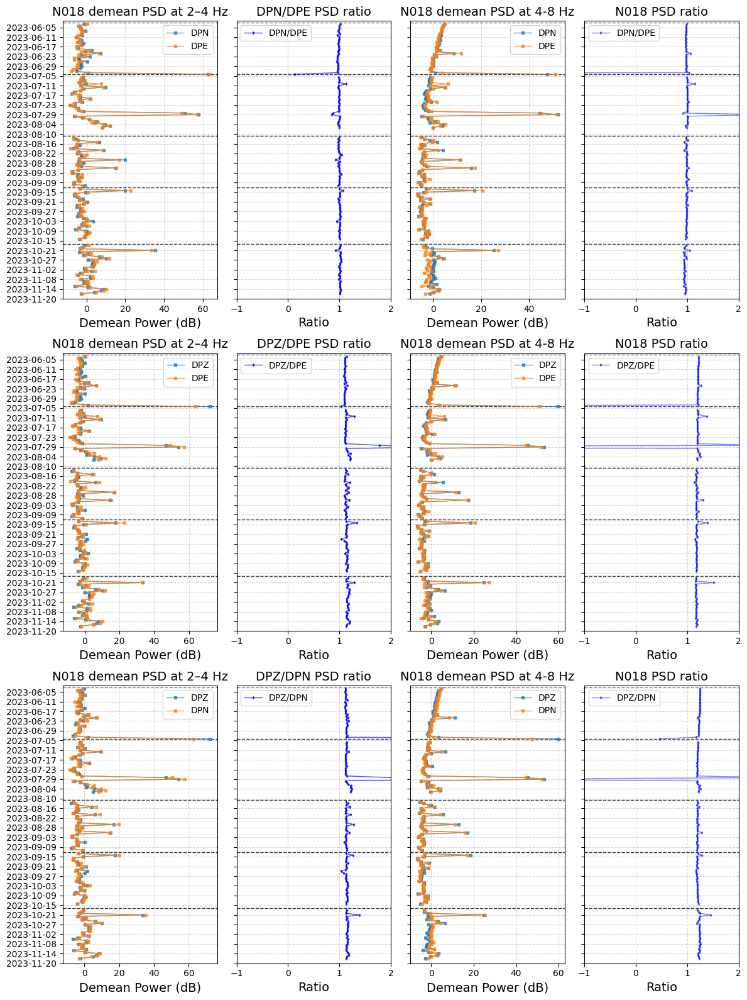

3 004 S009


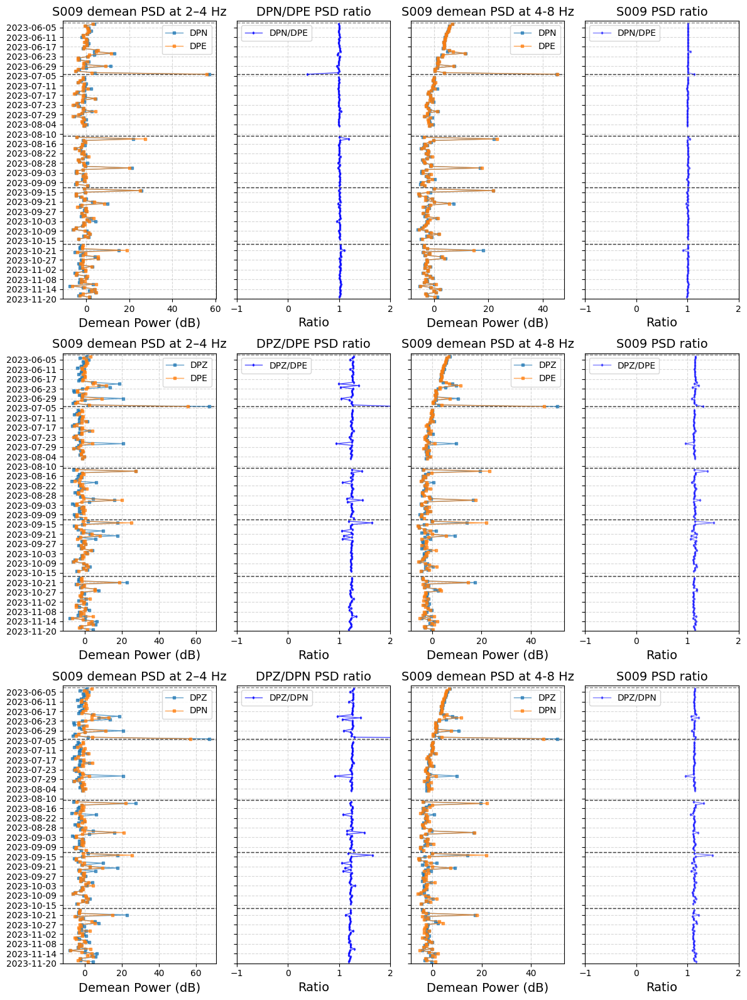

4 005 S024


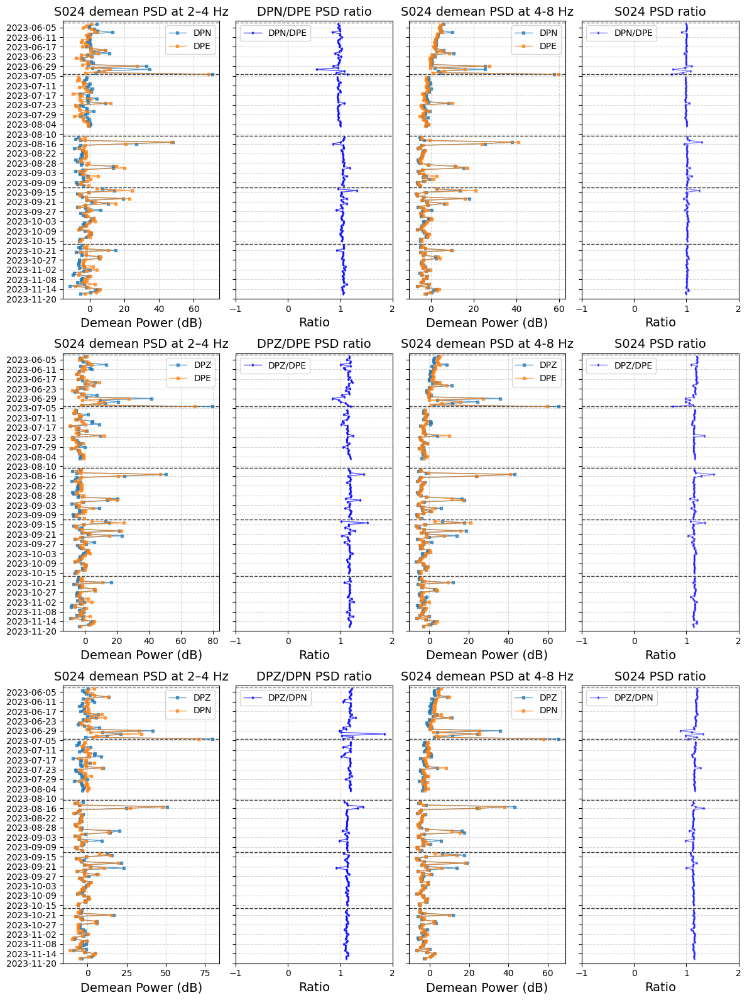

5 006 S043


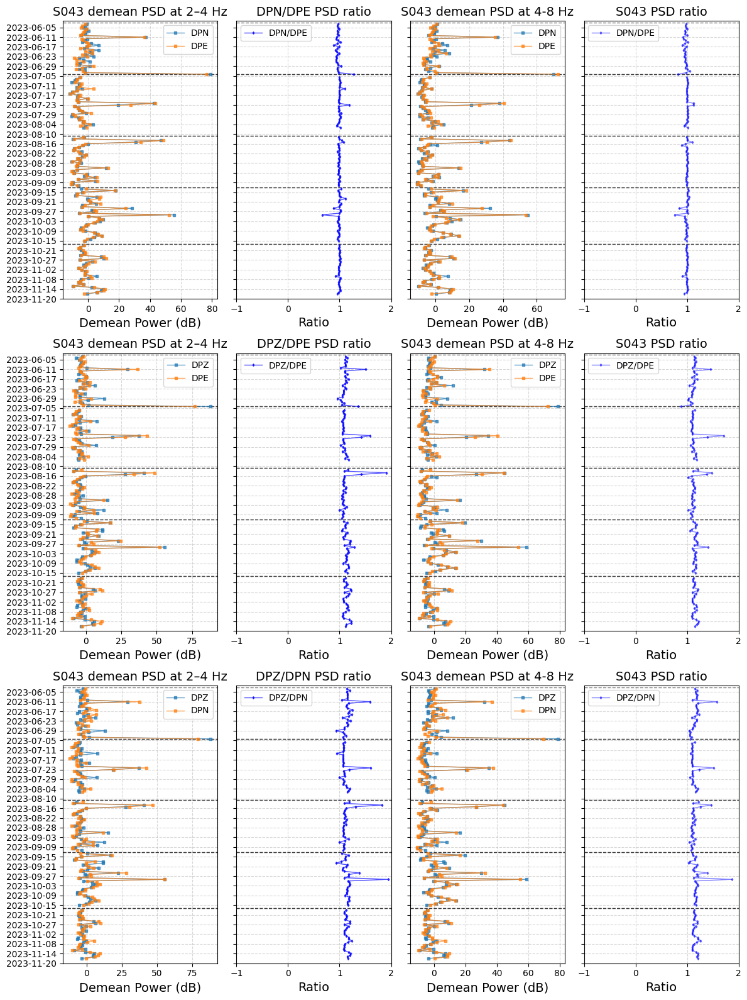

In [27]:
path = "../SL/DATA_20Hz/"

all_df_dict = {} 
for kstn, (stnm,rename) in enumerate(seis_sta[['stnm','stnm_renamed']].values):
    print (kstn, stnm, rename)
    # Collect SAC files
    sac_files = sorted(glob.glob(f"{path}/*/{stnm}*.SAC"))

    # Put into DataFrame
    df = PSD_analysis(sac_files)
    df["date"] = pd.to_datetime(df["date"])
    df.set_index("date", inplace=True)

    # Reindex to full daily range
    full_index = pd.date_range(df.index.min(), df.index.max(), freq="D")
    
    # # PSD_plot(df, rename, full_index)
    # PSD_demean_plot(df, rename, full_index)
    three_PSD_demean_plot(df, rename, full_index)
    
    # Store in dictionary
    all_df_dict[rename] = df


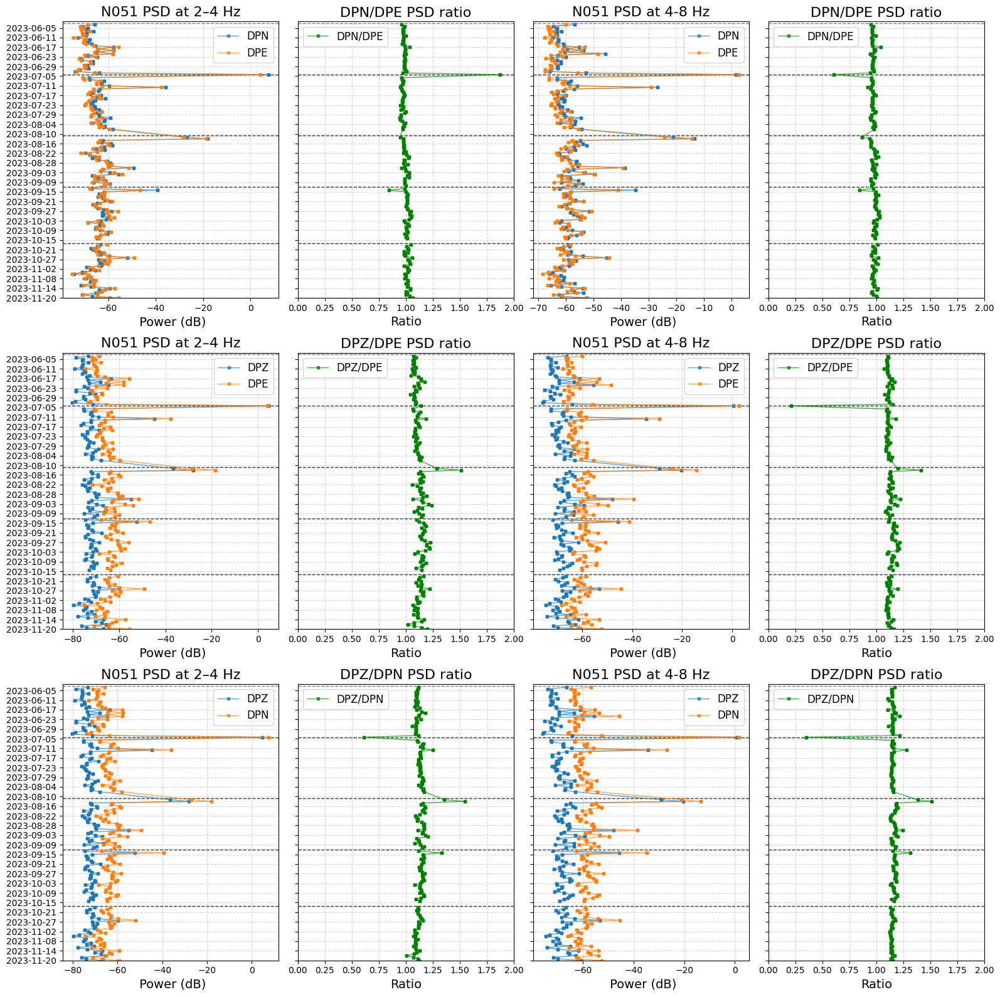

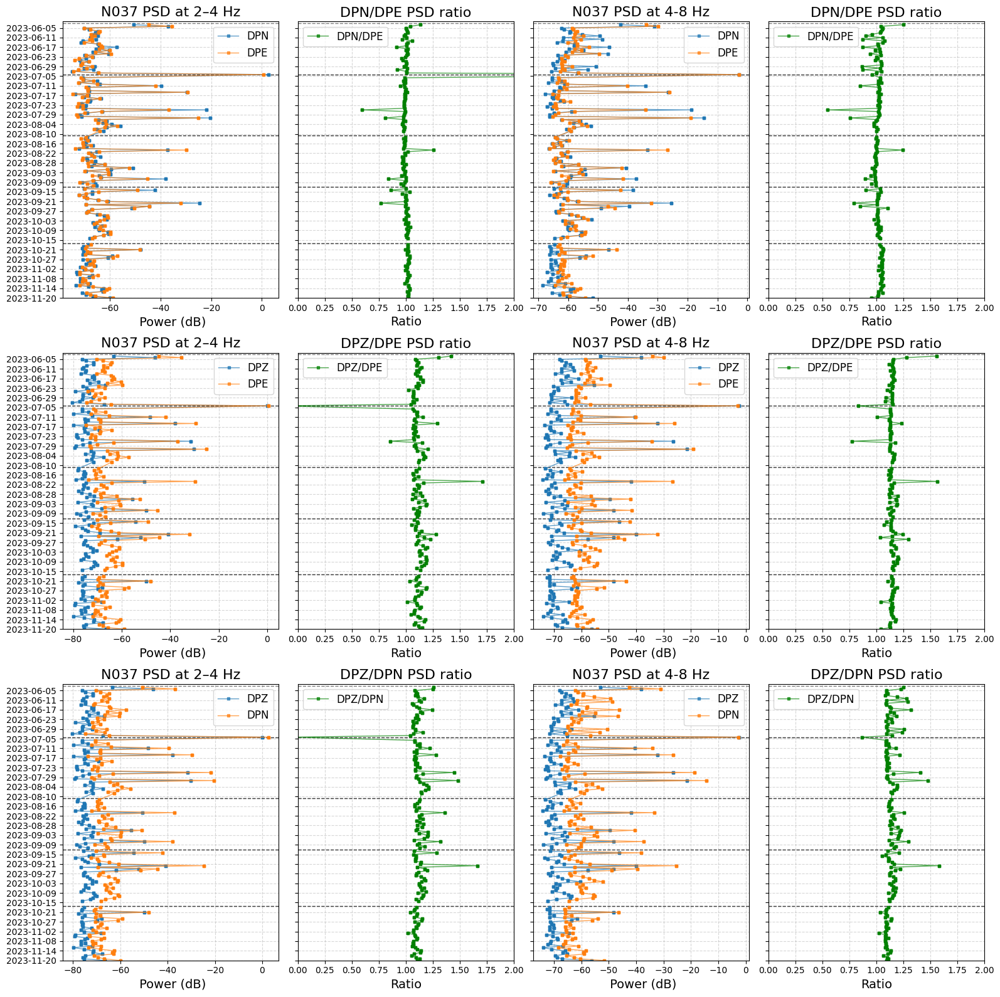

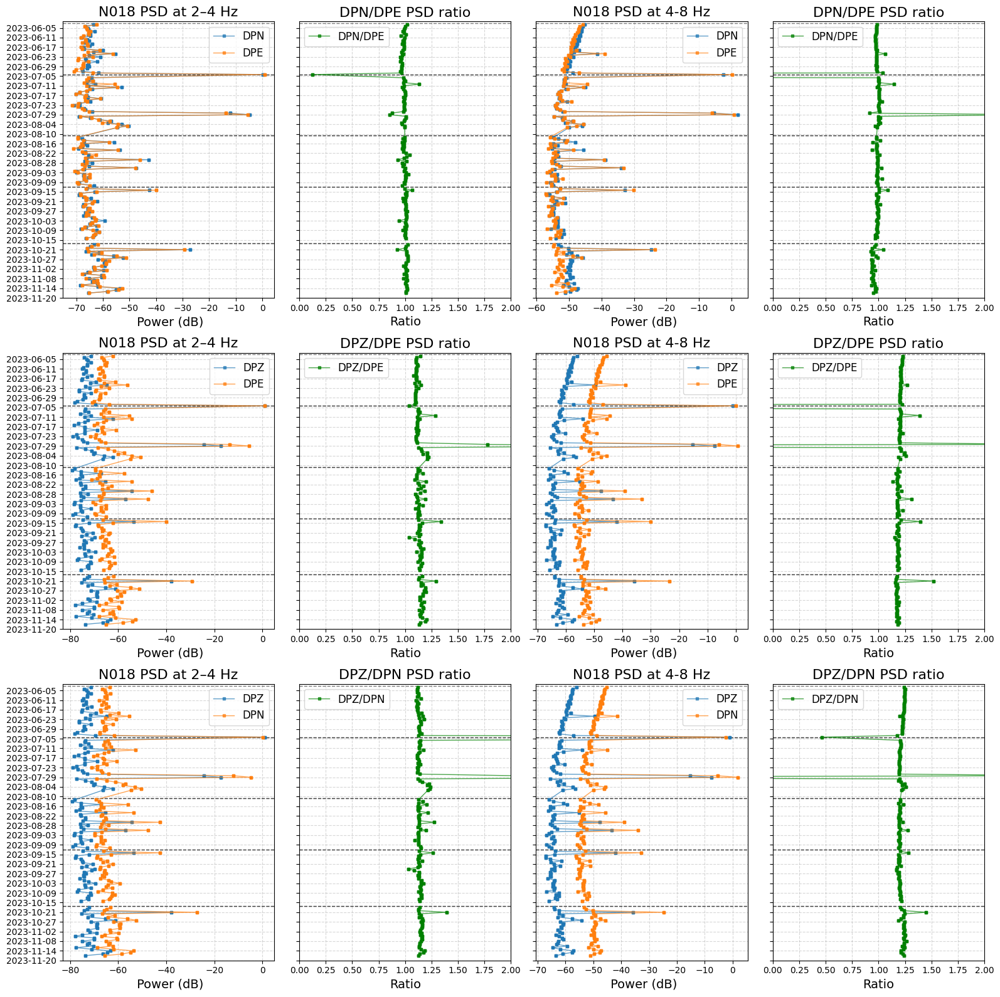

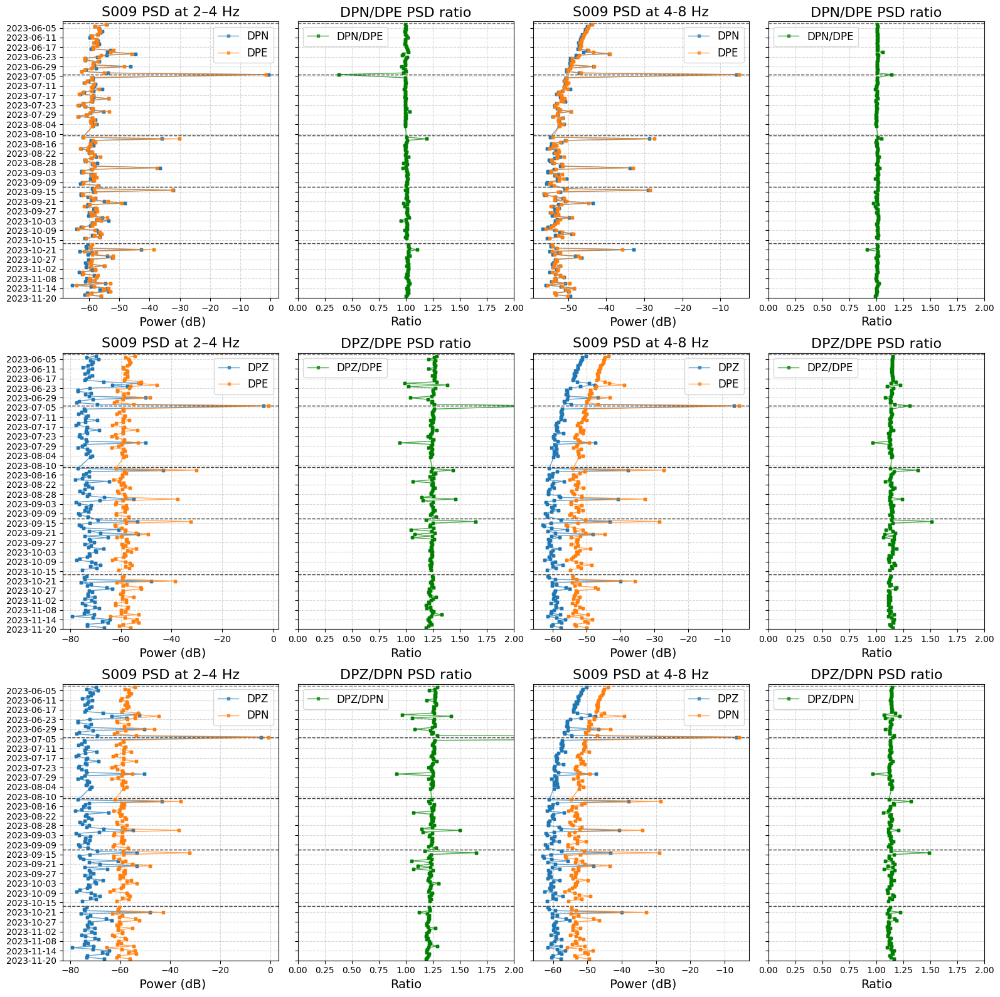

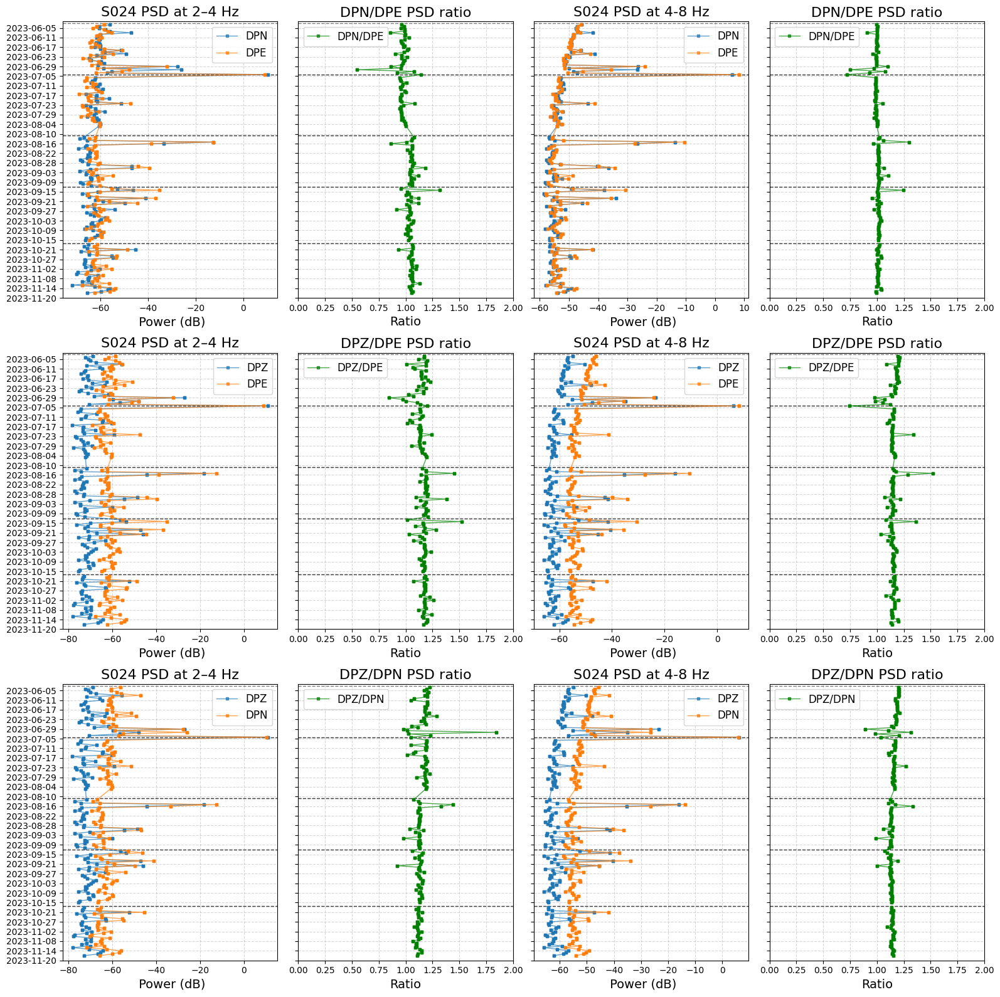

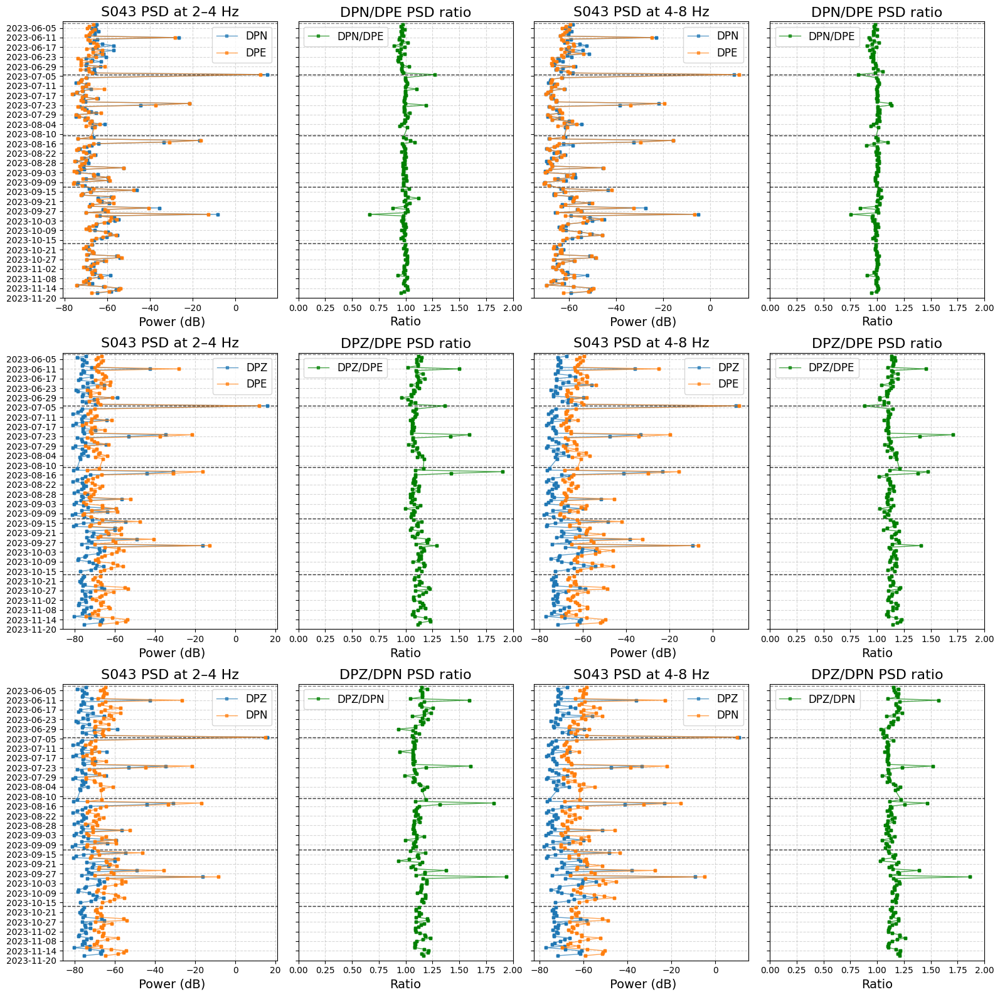

In [49]:
for rename, df in all_df_dict.items():
    # Reindex to full daily range
    full_index = df.index
    # PSD_demean_plot(df, rename, full_index)
    three_PSD_demean_plot(df, rename, full_index)

In [16]:
def PSD_diff_rms_plot(df, stnm, full_index, swap_file="swap.redb"):
    # Reindex for full daily coverage
    df_full = df.set_index(df.index).reindex(full_index)

    # Convert to dB
    df_full["PSD_2_4Hz_dB"] = 10*np.log10(df_full["PSD_2_4Hz"])
    df_full["PSD_4_8Hz_dB"] = 10*np.log10(df_full["PSD_4_8Hz"])

    # Daily differences
    df_full["diff_2_4Hz"] = df_full.groupby("component")["PSD_2_4Hz_dB"].diff()
    df_full["diff_4_8Hz"] = df_full.groupby("component")["PSD_4_8Hz_dB"].diff()

    # RMS per component
    rms_2_4 = df_full.groupby("component")["diff_2_4Hz"].apply(lambda x: np.sqrt(np.nanmean(x**2)))
    rms_4_8 = df_full.groupby("component")["diff_4_8Hz"].apply(lambda x: np.sqrt(np.nanmean(x**2)))

    # Read swap dates
    swap_dates = []
    with open(swap_file, 'r') as f:
        for line in f:
            for p in line.split():
                yyyy = 2000 + int(p[:2])
                mm, dd = int(p[2:4]), int(p[4:6])
                swap_dates.append(pd.to_datetime(f"{yyyy}-{mm:02d}-{dd:02d}"))

    # --- Plot layout ---
    fig, axes = plt.subplots(2, 2, figsize=(14,7), sharex="col")

    # --- Top row: 4–8 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df_full[df_full["component"] == comp]
        axes[0,0].plot(dsub.index, dsub["diff_4_8Hz"], "-o", ms=2, label=comp, alpha=0.6)
    axes[0,0].set_title(f"{stnm} | ΔPSD (4–8 Hz)")
    axes[0,0].set_ylabel("Δ Power (dB)")
    axes[0,0].grid(True, linestyle="--", alpha=0.5)
    for d in swap_dates:
        axes[0,0].axvline(d, color="blue", linestyle="--", alpha=0.5)

    # RMS barplot
    axes[0,1].bar(rms_4_8.index, rms_4_8.values, color=["brown","pink","cyan"])
    axes[0,1].set_title("RMS ΔPSD (4–8 Hz)")
    axes[0,1].set_ylabel("RMS (dB)")
    axes[0,1].grid(True, axis="y", linestyle="--", alpha=0.5)

    # --- Bottom row: 2–4 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df_full[df_full["component"] == comp]
        axes[1,0].plot(dsub.index, dsub["diff_2_4Hz"], "-o", ms=2, label=comp, alpha=0.6)
    axes[1,0].set_title(f"{stnm} | ΔPSD (2–4 Hz)")
    axes[1,0].set_ylabel("Δ Power (dB)")
    axes[1,0].grid(True, linestyle="--", alpha=0.5)
    for d in swap_dates:
        axes[1,0].axvline(d, color="blue", linestyle="--", alpha=0.5)

    # RMS barplot
    axes[1,1].bar(rms_2_4.index, rms_2_4.values, color=["brown","pink","cyan"])
    axes[1,1].set_title("RMS ΔPSD (2–4 Hz)")
    axes[1,1].set_ylabel("RMS (dB)")
    axes[1,1].grid(True, axis="y", linestyle="--", alpha=0.5)

    # --- Format x-axis ---
    for ax in [axes[1,0]]:
        ax.set_xlabel("Date")
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=90)

    axes[0,0].legend()
    plt.tight_layout()
    plt.show()


In [45]:

def PSD_diff_abs_plot(df, stnm, full_index, swap_file="swap.redb"):
    # Reindex for full daily coverage
    df_full = df.set_index(df.index).reindex(full_index)

    # Convert to dB
    df_full["PSD_2_4Hz_dB"] = 10 * np.log10(df_full["PSD_2_4Hz"])
    df_full["PSD_4_8Hz_dB"] = 10 * np.log10(df_full["PSD_4_8Hz"])

    # Daily differences
    df_full["diff_2_4Hz"] = df_full.groupby("component")["PSD_2_4Hz_dB"].diff()
    df_full["diff_4_8Hz"] = df_full.groupby("component")["PSD_4_8Hz_dB"].diff()

    # Absolute values of differences (envelope)
    df_full["abs_diff_2_4Hz"] = df_full["diff_2_4Hz"].abs()
    df_full["abs_diff_4_8Hz"] = df_full["diff_4_8Hz"].abs()

    # Read swap dates
    swap_dates = []
    with open(swap_file, "r") as f:
        for line in f:
            for p in line.split():
                yyyy = 2000 + int(p[:2])
                mm, dd = int(p[2:4]), int(p[4:6])
                swap_dates.append(pd.to_datetime(f"{yyyy}-{mm:02d}-{dd:02d}"))

    # --- Plot layout ---
    fig, axes = plt.subplots(2, 2, figsize=(14, 7), sharex="col")

    # --- Top row: 4–8 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df_full[df_full["component"] == comp]
        axes[0, 0].plot(dsub.index, dsub["diff_4_8Hz"], "-o", ms=2, label=comp, alpha=0.6)
        axes[0, 1].plot(dsub.index, dsub["abs_diff_4_8Hz"], "-o", ms=2, label=comp, alpha=0.6)
    axes[0, 0].set_title(f"{stnm} | ΔPSD (4–8 Hz)")
    axes[0, 1].set_title(f"{stnm} | |ΔPSD| (4–8 Hz)")
    axes[0, 0].set_ylabel("Δ Power (dB)")
    axes[0, 1].set_ylabel("|Δ Power| (dB)")

    # --- Bottom row: 2–4 Hz ---
    for comp in sorted(df["component"].unique()):
        dsub = df_full[df_full["component"] == comp]
        axes[1, 0].plot(dsub.index, dsub["diff_2_4Hz"], "-o", ms=2, label=comp, alpha=0.6)
        axes[1, 1].plot(dsub.index, dsub["abs_diff_2_4Hz"], "-o", ms=2, label=comp, alpha=0.6)
    axes[1, 0].set_title(f"{stnm} | ΔPSD (2–4 Hz)")
    axes[1, 1].set_title(f"{stnm} | |ΔPSD| (2–4 Hz)")
    axes[1, 0].set_ylabel("Δ Power (dB)")
    axes[1, 1].set_ylabel("|Δ Power| (dB)")

    # --- Add swap date lines ---
    for ax in axes.flatten():
        for d in swap_dates:
            ax.axvline(d, color="blue", linestyle="--", alpha=0.5)
        ax.grid(True, linestyle="--", alpha=0.5)

    # --- Format x-axis ---
    for ax in [axes[1, 0], axes[1, 1]]:
        ax.set_xlabel("Date")
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
        ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=90)

    axes[0, 0].legend(loc='upper right')
    axes[0, 1].legend(loc='upper right')
    axes[1, 0].legend(loc='upper right')
    axes[1, 1].legend(loc='upper right')

    plt.tight_layout()
    plt.show()


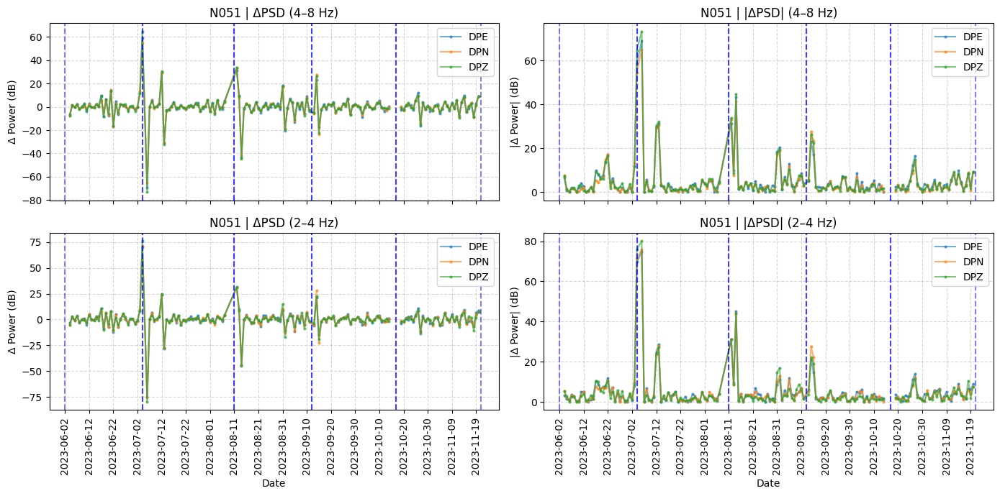

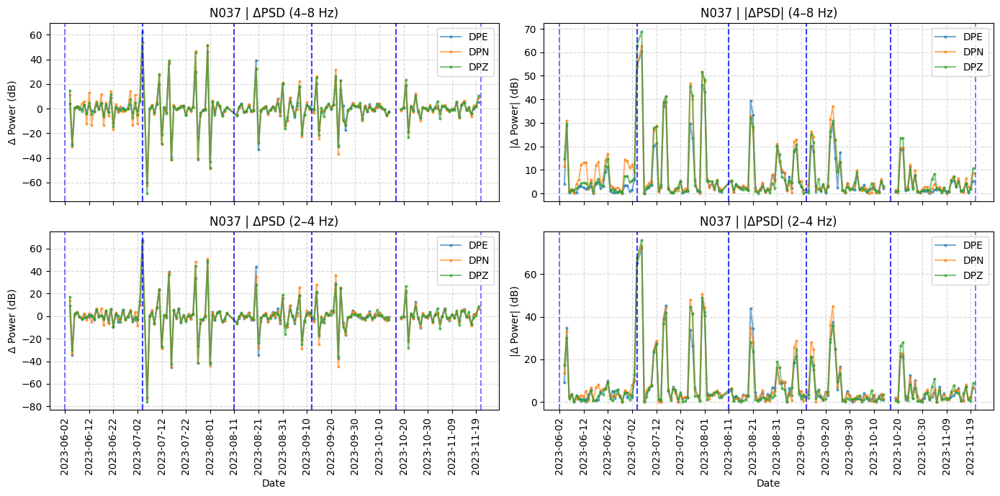

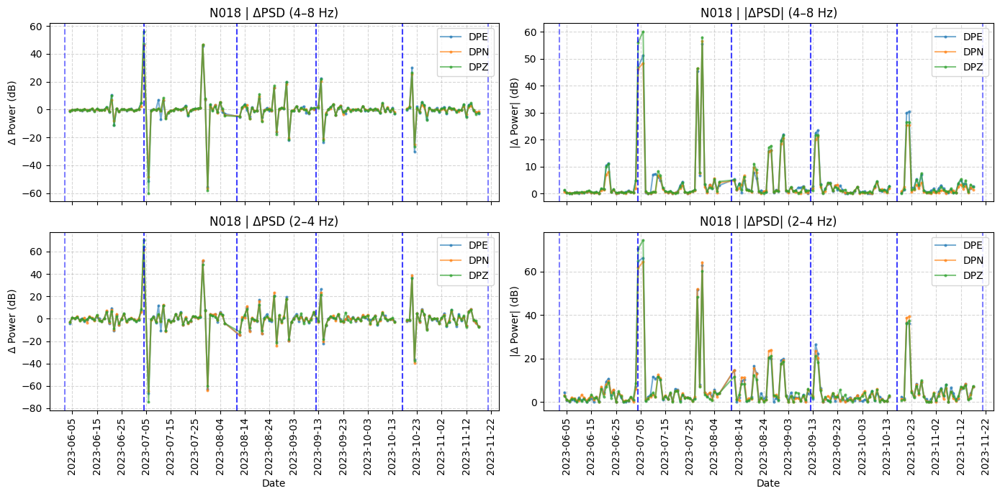

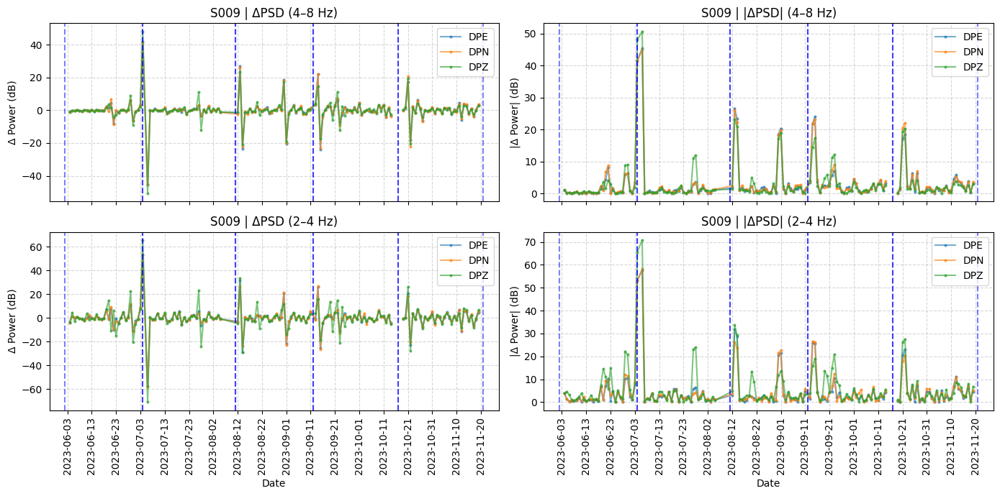

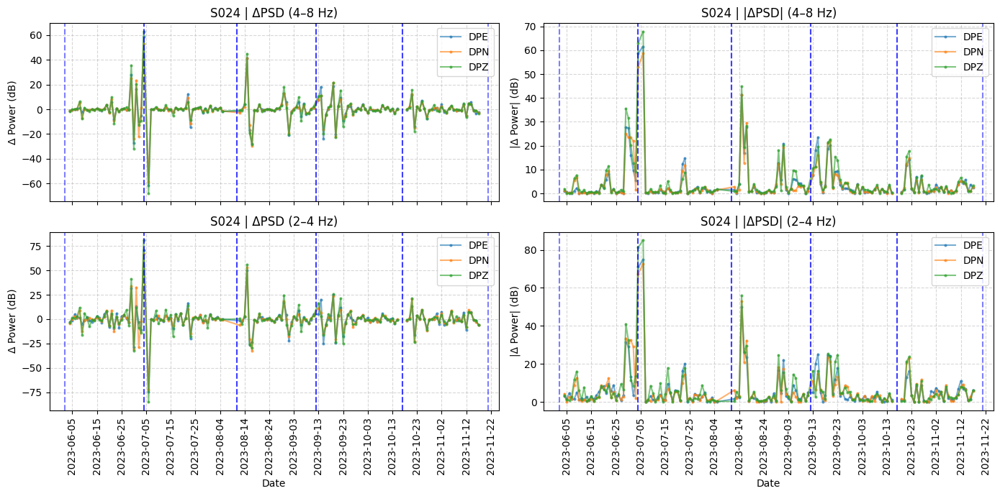

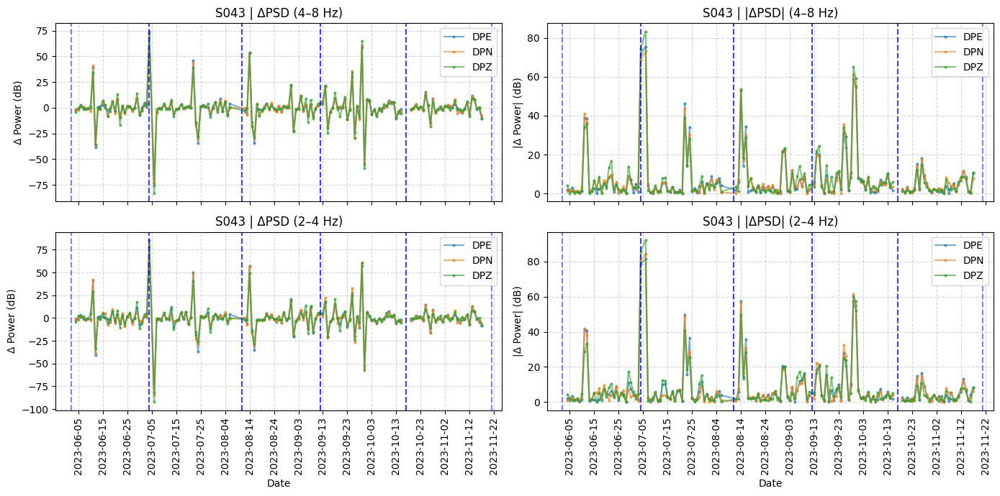

In [46]:
for stnm, df in all_df_dict.items():
    # Reindex to full daily range
    full_index = df.index
    # PSD_diff_rms_plot(df, stnm, full_index)
    PSD_diff_abs_plot(df, stnm, full_index)

In [96]:
def plot_combined_PSD(all_df_dict, full_index, swap_file="swap.redb"):

    # --- Read swap dates ---
    swap_dates = []
    with open(swap_file, 'r') as f:
        for line in f:
            parts = line.split()
            for p in parts:
                yyyy = int(p[:2]) + 2000
                mm = int(p[2:4])
                dd = int(p[4:6])
                swap_dates.append(pd.to_datetime(f"{yyyy}-{mm:02d}-{dd:02d}"))

    # --- Set color list ---
    color_list = ['brown', 'magenta', 'cyan', 'red', 'blue', 'green']
    stations = list(all_df_dict.keys())
    n_colors = len(color_list)

    fig, axes = plt.subplots(2, 1, figsize=(12,8), sharex=True)

    # --- Loop over stations ---
    for i, stnm in enumerate(stations):
        df = all_df_dict[stnm]

        # Compute combined PSD (average of 3 components)
        combined_2_4Hz = []
        combined_4_8Hz = []

        for d in full_index:
            dsub = df[df.index == d]
            if len(dsub) == 3:
                combined_2_4Hz.append(dsub["PSD_2_4Hz"].mean())
                combined_4_8Hz.append(dsub["PSD_4_8Hz"].mean())
            else:
                combined_2_4Hz.append(np.nan)
                combined_4_8Hz.append(np.nan)

        # Cycle through colors
        color = color_list[i % n_colors]

        # Plot
        axes[1].plot(full_index, 10*np.log10(combined_2_4Hz), "-o", ms=2, label=stnm, alpha=0.5, color=color)
        axes[0].plot(full_index, 10*np.log10(combined_4_8Hz), "-o", ms=2, label=stnm, alpha=0.5, color=color)

    # --- Format axes ---
    for ax, band in zip(axes, [ "4–8 Hz", "2–4 Hz",]):
        ax.set_title(f"Combined 3-component PSD ({band})")
        ax.set_ylabel("Power (dB)")
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(fontsize=8, ncol=2)
        ax.set_xlim(full_index.min(), full_index.max())
        ax.xaxis.set_major_locator(mdates.DayLocator(interval=10))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        # Vertical lines for swap dates
        for d in swap_dates:
            ax.axvline(d, color='grey', linestyle='--', alpha=0.5)

    axes[1].set_xlabel("Date")
    plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=90)
    plt.tight_layout()
    plt.show()


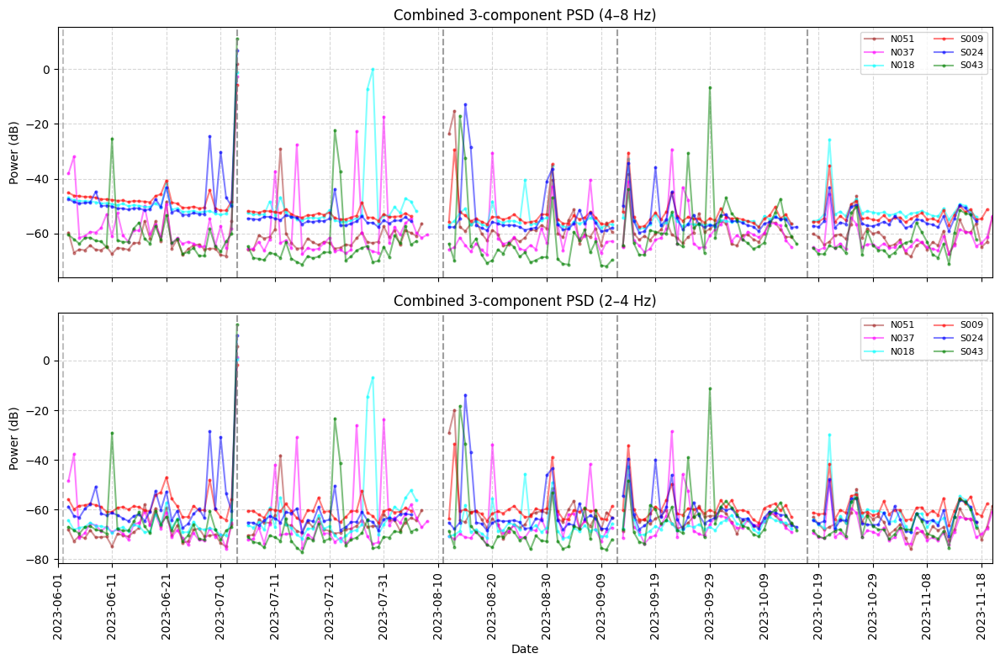

In [97]:
full_index = pd.date_range("2023-06-01", "2023-11-20", freq="D")

plot_combined_PSD(all_df_dict, full_index, swap_file="swap.redb")


In [110]:
all_df_dict['N037']

,component,PSD_2_4Hz,PSD_4_8Hz
date,,,
2023-06-03,DPE,3.434497e-05,0.000400
2023-06-03,DPN,8.787089e-06,0.000057
2023-06-03,DPZ,4.539638e-07,0.000005
2023-06-04,DPE,2.842870e-04,0.001008
2023-06-04,DPN,2.006017e-04,0.000766
...,...,...,...
2023-11-20,DPN,9.780204e-07,0.000007
2023-11-20,DPZ,2.220154e-07,0.000002
2023-11-21,DPE,NaN,NaN


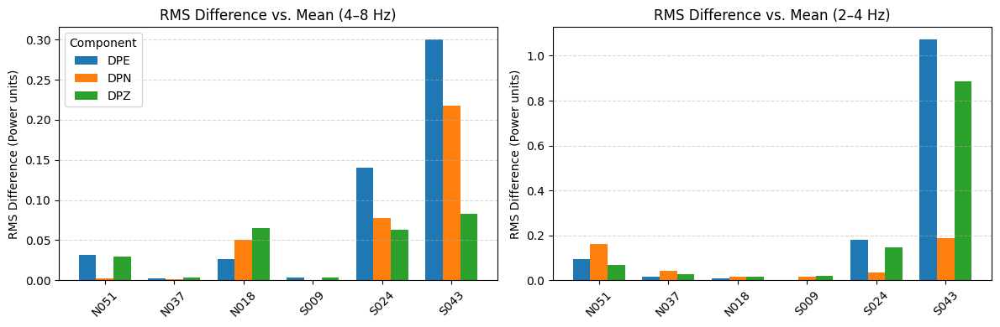

In [131]:
# --- Plot grouped bars ---
components = rms_df["component"].unique()
x = np.arange(len(rms_df["station"].unique()))  # station positions
width = 0.25  # bar width

fig, axes = plt.subplots(1, 2, figsize=(12,4), )

for i, band in enumerate(rms_df["band"].unique()[::-1]):
    subset = rms_df[rms_df["band"]==band]
    stations = subset["station"].unique()

    for j, comp in enumerate(components):
        comp_vals = subset[subset["component"]==comp].set_index("station").loc[stations]["RMS_diff"]
        axes[i].bar(x + j*width, comp_vals, width, label=comp)

    axes[i].set_xticks(x + width)
    axes[i].set_xticklabels(stations, rotation=45)
    axes[i].set_ylabel("RMS Difference (Power units)")
    axes[i].set_title(f"RMS Difference vs. Mean ({band})")
    axes[i].grid(axis="y", linestyle="--", alpha=0.5)
    
axes[0].legend(title="Component")
plt.tight_layout()
plt.show()
